### Importing the necessary libraries

In [39]:
import keras
import kerastuner as kt
from sklearn.metrics import classification_report
import os
import numpy as np
from PIL import Image
import tensorflow as tf
from tensorflow.keras.preprocessing.image import ImageDataGenerator
from tensorflow.keras.utils import img_to_array, load_img
from sklearn.utils import shuffle
import random
from matplotlib import pyplot as plt
import seaborn as sns
import pandas as pd

from keras.models import Sequential
from keras.layers import Conv2D, MaxPooling2D, Flatten, Dense, Dropout, GlobalAveragePooling2D
from tensorflow.keras.optimizers import Adam, AdamW
from tensorflow.keras.callbacks import EarlyStopping, ReduceLROnPlateau
from tensorflow.keras.layers.experimental.preprocessing import RandomCrop, RandomFlip, RandomRotation, RandomZoom, RandomContrast
from sklearn.metrics import classification_report

from cv2 import cvtColor, COLOR_BGR2GRAY
import cv2

import math

from sklearn.model_selection import train_test_split
from tensorflow.keras.layers import BatchNormalization

import matplotlib.patches as mpatches 

import warnings
warnings.filterwarnings("ignore")


# moving

In [40]:
# Get the current working directory
current_directory = os.getcwd()
current_directory

'c:\\Users\\X571\\Downloads\\DeepLearning24_25'

# Stage 1

# Visualization

### We will compare the differences between benign and malignant cells to see if we can spot anything noticeable with the naked eye.

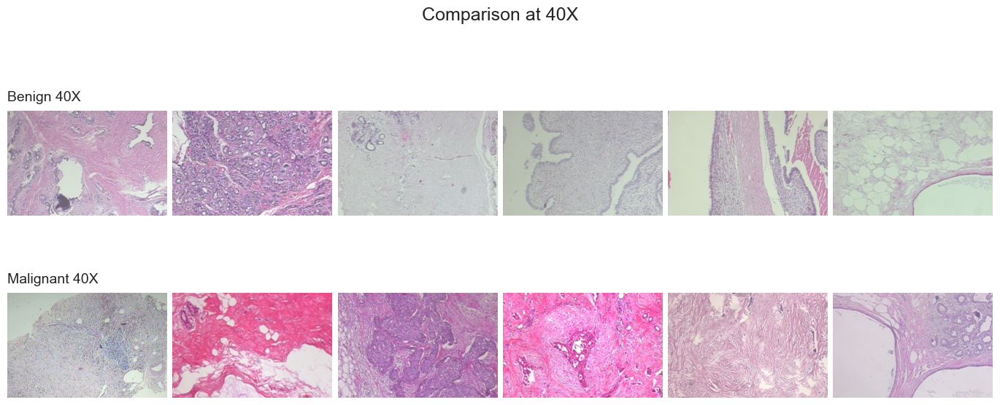

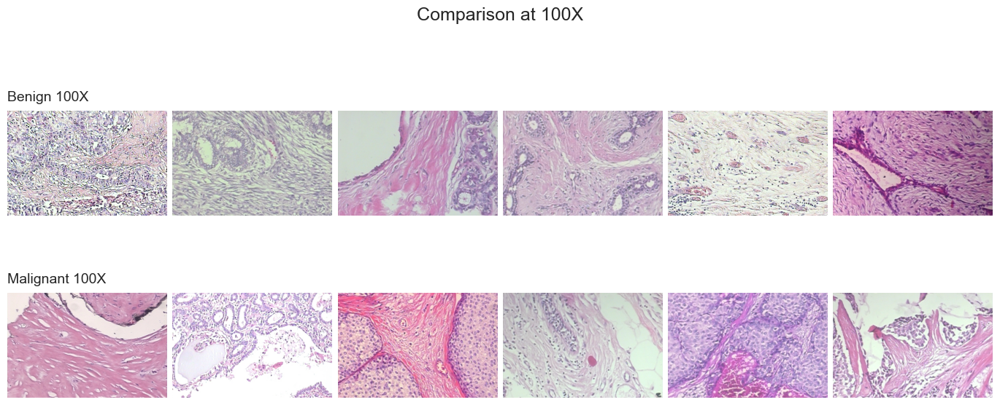

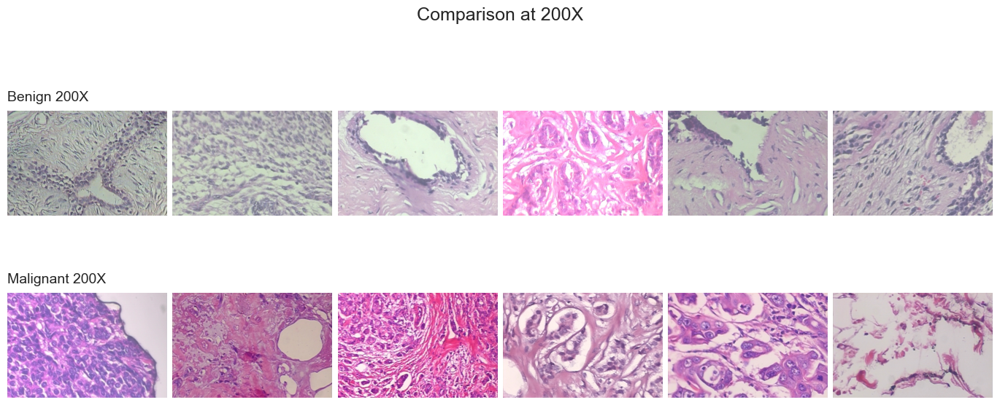

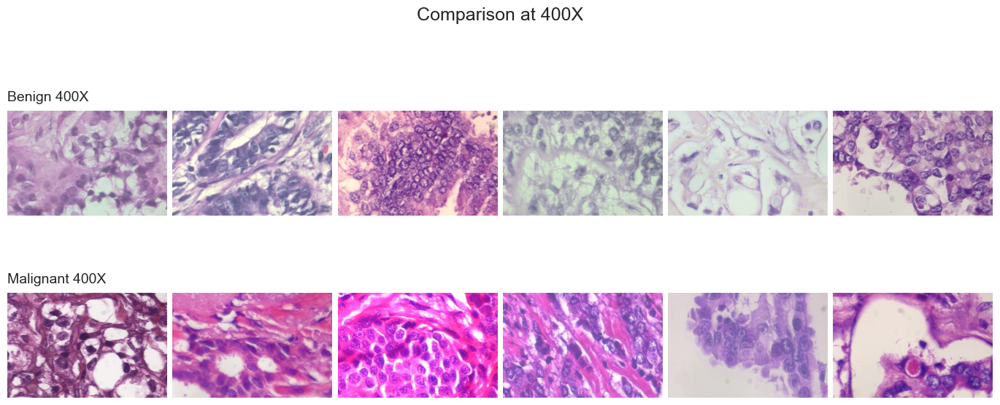

In [42]:
# Define paths
base_dir = "data_for_visualization"
categories = ["benign", "malignant"]
magnifications = ["40X", "100X", "200X", "400X"]

# Function to load multiple random images
def load_random_images(base_path, category, magnification, num_images=6):
    folder_path = os.path.join(base_path, category, magnification)
    files = [f for f in os.listdir(folder_path) if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))]
    random_files = random.sample(files, min(len(files), num_images)) if files else []
    return [Image.open(os.path.join(folder_path, f)) for f in random_files]

# Plot random images
for magnification in magnifications:
    fig, axes = plt.subplots(2, 6, figsize=(15, 7))  # 2 rows (benign, malignant) x 6 images each
    
    
    fig.suptitle(f"Comparison at {magnification}", fontsize=18, y=0.96)
    
    titles = [f"Benign {magnification}", f"Malignant {magnification}"]
    for row, category in enumerate(categories):
        images = load_random_images(base_dir, category, magnification, num_images=6)
        
        
        row_title_ax = axes[row, 0]
        row_title_ax.set_title(titles[row], loc='left', fontsize=14, pad=10)
        
        for col, ax in enumerate(axes[row]):
            if col < len(images):
                ax.imshow(images[col])
            ax.axis('off')  
    
  
    plt.tight_layout(pad=1.0, h_pad=0.5, w_pad=0.5)
    plt.subplots_adjust(top=0.9, bottom=0.05, left=0.05, right=0.95)
    plt.show()


### By iterating even more over the beningn and maligant images we found some interesting insigths. We will plot some specific images:

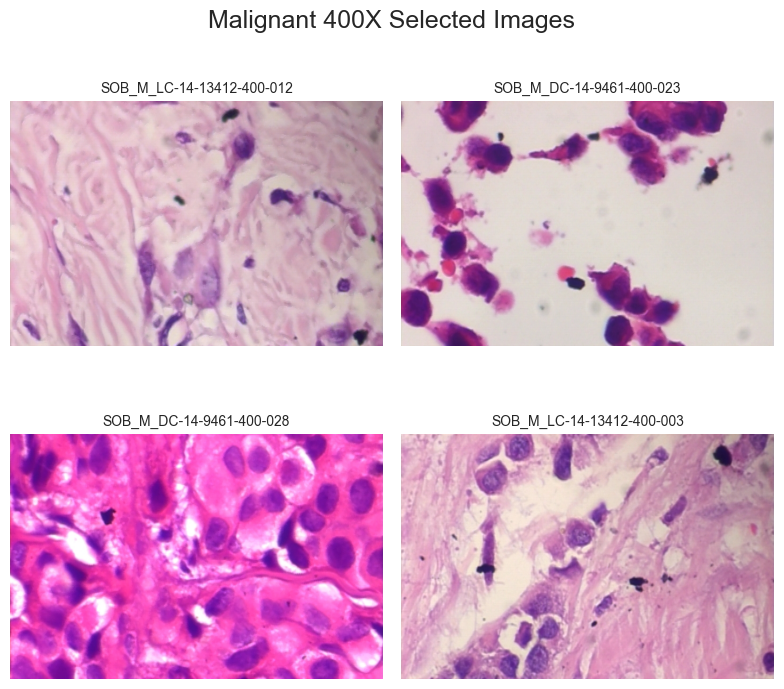

In [43]:
# Define paths
base_dir = "data_for_visualization"
category = "malignant"
magnification = "400X"
image_names = [
    "SOB_M_LC-14-13412-400-012",
    "SOB_M_DC-14-9461-400-023",
    "SOB_M_DC-14-9461-400-028",
    "SOB_M_LC-14-13412-400-003",
]

# Load specific images
images = []
folder_path = os.path.join(base_dir, category, magnification)

for image_name in image_names:
    image_path = os.path.join(folder_path, f"{image_name}.png")  # Assuming images are .png
    if os.path.exists(image_path):
        images.append(Image.open(image_path))
    else:
        print(f"Image not found: {image_path}")

# Plot
fig, axes = plt.subplots(2, 2, figsize=(8, 8))  
fig.suptitle(f"{category.capitalize()} {magnification} Selected Images", fontsize=18, y=0.95)

axes = axes.flatten()

for ax, img, img_name in zip(axes, images, image_names):
    ax.imshow(img)
    ax.axis("off")  
    ax.set_title(img_name, fontsize=10)

for ax in axes[len(images):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


### We can see the presence of black dots. These black dots mostly appear on the maligant images

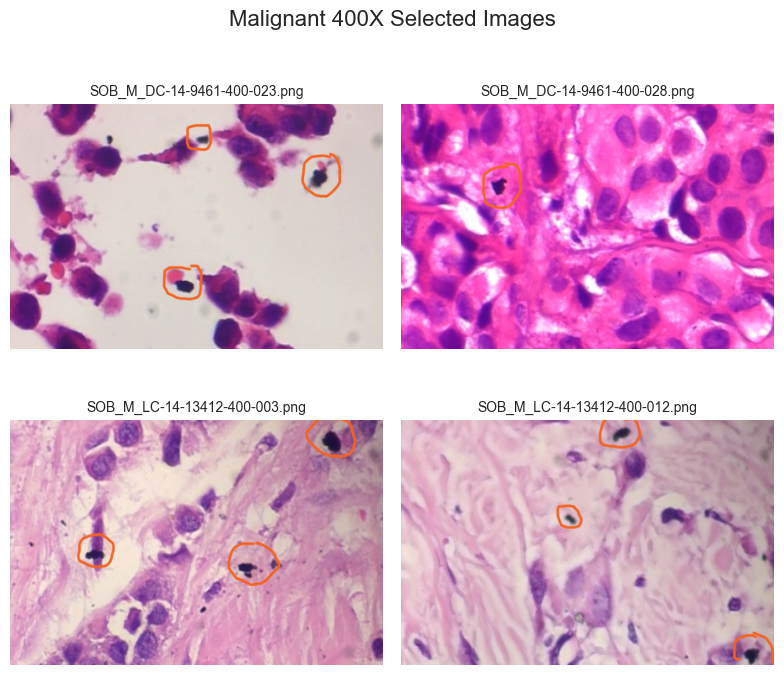

In [44]:
# Define path to the folder
base_dir = "some_extra_data"

# Get a list of all image files in the folder 
image_files = [
    f for f in os.listdir(base_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))
][:4]  # Take the first 4 images

# Load the images
images = [Image.open(os.path.join(base_dir, img)) for img in image_files]

# Create a 2x2 plot
fig, axes = plt.subplots(2, 2, figsize=(8, 8)) 
fig.suptitle("Malignant 400X Selected Images", fontsize=16, y=0.92)

# Plot images
for ax, img, img_name in zip(axes.flatten(), images, image_files):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_name, fontsize=10)

for ax in axes.flatten()[len(images):]:
    ax.axis("off")

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


### Here, we can see that there are some dots in the benign images as well, but they have a slightly different color. They appear more grayish and less black.

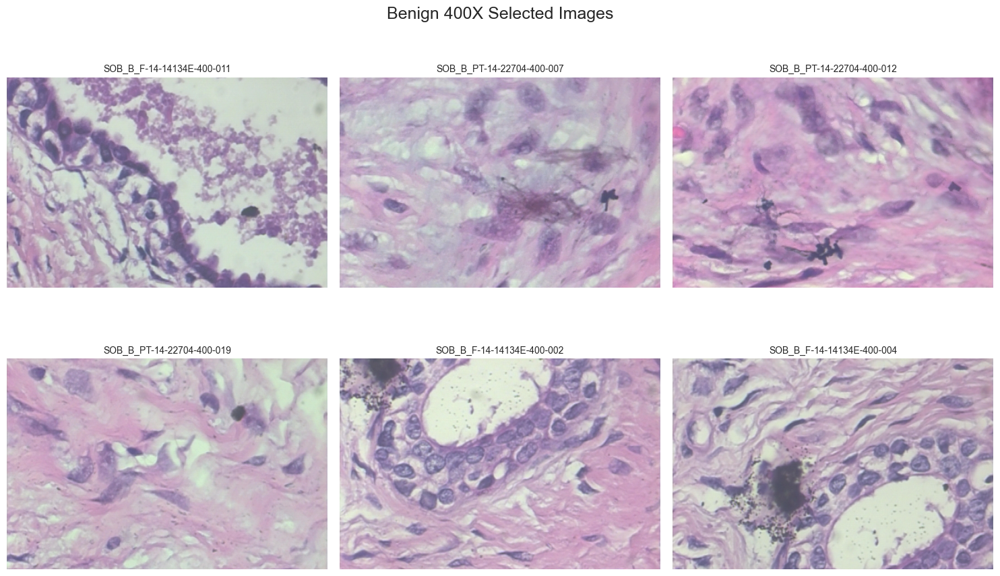

In [45]:
# Define paths
base_dir = "data_for_visualization"
category = "benign"
magnification = "400X"
image_names = [
    "SOB_B_F-14-14134E-400-011",
    "SOB_B_PT-14-22704-400-007",
    "SOB_B_PT-14-22704-400-012",
    "SOB_B_PT-14-22704-400-019",
    "SOB_B_F-14-14134E-400-002",
    "SOB_B_F-14-14134E-400-004",
]

# Load specific images
images = []
folder_path = os.path.join(base_dir, category, magnification)

for image_name in image_names:
    image_path = os.path.join(folder_path, f"{image_name}.png")  # Assuming images are .png
    if os.path.exists(image_path):
        images.append(Image.open(image_path))
    else:
        print(f"Image not found: {image_path}")

# Plot the images
fig, axes = plt.subplots(2, 3, figsize=(15, 10))  
fig.suptitle(f"{category.capitalize()} {magnification} Selected Images", fontsize=18, y=0.95)

axes = axes.flatten()

for ax, img, img_name in zip(axes, images, image_names):
    ax.imshow(img)
    ax.axis("off")  
    ax.set_title(img_name, fontsize=10)

for ax in axes[len(images):]:
    ax.axis("off")

plt.tight_layout()
plt.show()


# Feature Extraction

## Texture Analysis

#### We will use Gray Level Co-occurrence Matrix (GLCM) to extract features from the image

In [46]:
# GLCM calculation from scratch
def compute_glcm(image, distances=[1], angles=[0], levels=256):
    """
    Compute GLCM from an image using numpy.
    :param image: Grayscale image as a numpy array.
    :param distances: List of distances for pixel pair relationships.
    :param angles: List of angles in radians.
    :param levels: Number of intensity levels in the image.
    :return: Normalized GLCM matrix.
    """
    glcm = np.zeros((levels, levels))
    for d in distances:
        for angle in angles:
            offset_row = int(d * np.sin(angle))
            offset_col = int(d * np.cos(angle))
            for i in range(image.shape[0] - abs(offset_row)):
                for j in range(image.shape[1] - abs(offset_col)):
                    row = image[i, j]
                    col = image[i + offset_row, j + offset_col]
                    glcm[row, col] += 1
    glcm /= glcm.sum()  
    return glcm

# Load image and convert to grayscale
image = cv2.imread(current_directory + "/data_for_visualization/benign/40X/SOB_B_A-14-22549AB-40-001.png")
gray_image = cvtColor(image, COLOR_BGR2GRAY)

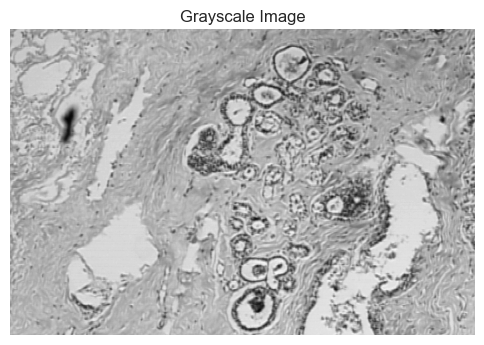

In [47]:
# Plot the grayscale image
plt.figure(figsize=(6, 6))
plt.imshow(gray_image, cmap='gray')
plt.title("Grayscale Image")
plt.axis('off')  
plt.show()

In [48]:
# Compute GLCM
glcm_matrix = compute_glcm(gray_image)
print("GLCM Matrix:", glcm_matrix)

GLCM Matrix: [[0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 ...
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]
 [0. 0. 0. ... 0. 0. 0.]]


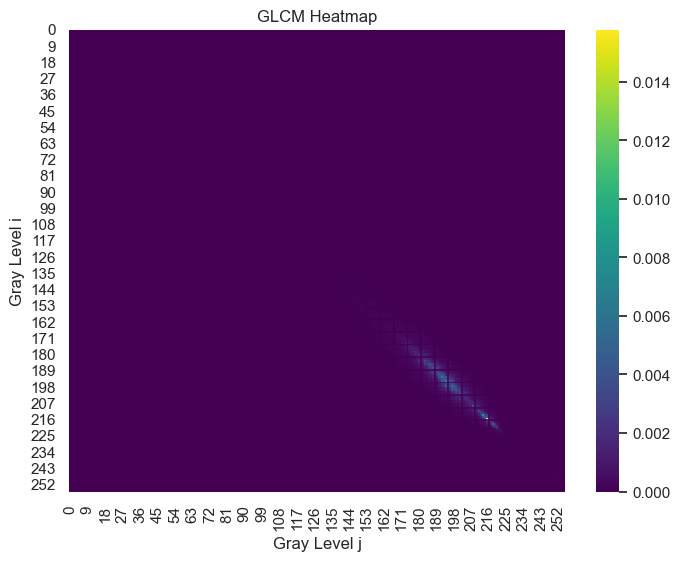

In [49]:
# Example: Visualizing the GLCM as a heatmap
def plot_glcm_heatmap(glcm, title="GLCM Heatmap"):
    plt.figure(figsize=(8, 6))
    sns.heatmap(glcm, cmap='viridis', annot=False)
    plt.title(title)
    plt.xlabel('Gray Level j')
    plt.ylabel('Gray Level i')
    plt.show()


plot_glcm_heatmap(glcm_matrix, title="GLCM Heatmap")


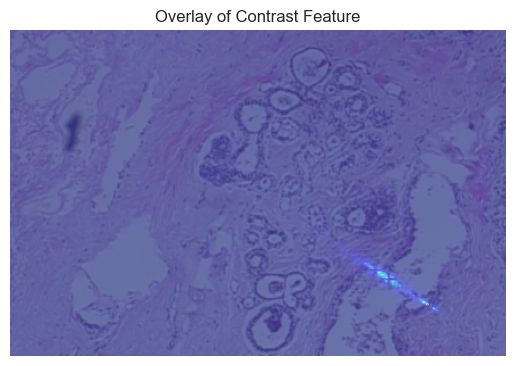

In [50]:
# Example overlay
def overlay_glcm_features(image, glcm, feature='contrast'):
    
    normalized_glcm = (glcm - np.min(glcm)) / (np.max(glcm) - np.min(glcm))
    
    resized_glcm = cv2.resize(normalized_glcm, (image.shape[1], image.shape[0]))
    
    plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
    plt.imshow(resized_glcm, cmap='jet', alpha=0.5)  
    plt.title(f"Overlay of {feature.capitalize()} Feature")
    plt.axis('off')
    plt.show()

overlay_glcm_features(image, glcm_matrix, feature="contrast")


Essentially, the values above 0 reflect the presence of certain patterns in pixel intensities, where the more intense the color, the more frequently those specific pixel pairings appear in the image. These patterns can reveal details about the texture or structure of the image.

#### Using Local Binary Patterns (LBP)

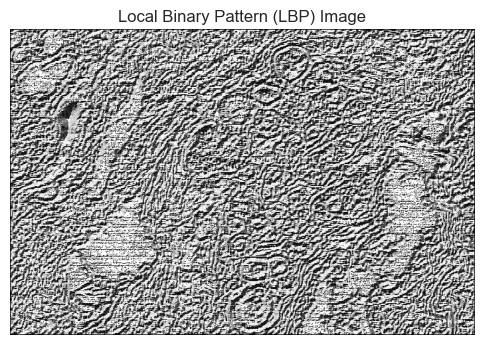

In [51]:
def compute_lbp(image, radius=1):
    """
    Compute Local Binary Pattern (LBP) for an image.
    :param image: Grayscale image as a numpy array.
    :param radius: Radius of the neighborhood.
    :return: LBP image.
    """
    lbp_image = np.zeros_like(image, dtype=np.uint8)
    for y in range(radius, image.shape[0] - radius):
        for x in range(radius, image.shape[1] - radius):
            center = image[y, x]
            binary_pattern = 0
            for i, (dy, dx) in enumerate([(-1, -1), (-1, 0), (-1, 1), (0, -1), (0, 1), (1, -1), (1, 0), (1, 1)]):
                if image[y + dy, x + dx] >= center:
                    binary_pattern |= 1 << i
            lbp_image[y, x] = binary_pattern
    return lbp_image

# Compute LBP
lbp_result = compute_lbp(gray_image)

# Display the LBP image 
plt.figure(figsize=(6, 6))
plt.imshow(lbp_result, cmap='gray')
plt.title("Local Binary Pattern (LBP) Image")
plt.axis('off')  
plt.show()


## Morphological features

### Segmenting the image and extracting Morphological Features

In [52]:
# Segment the image using thresholding
def segment_image(image):
    """
    Segment the input image using Otsu's thresholding.
    :param image: Grayscale image as a numpy array.
    :return: Binary mask of the segmented regions.
    """
    _, binary = cv2.threshold(image, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)
    return binary

# Extract morphological features
def extract_morphological_features(binary_image):
    """
    Extract morphological features from a binary image.
    :param binary_image: Binary image as a numpy array.
    :return: Dictionary with morphological features.
    """
    contours, _ = cv2.findContours(binary_image, cv2.RETR_EXTERNAL, cv2.CHAIN_APPROX_SIMPLE)
    features = []
    for contour in contours:
        area = cv2.contourArea(contour)
        perimeter = cv2.arcLength(contour, True)
        hull = cv2.convexHull(contour)
        solidity = area / cv2.contourArea(hull) if cv2.contourArea(hull) > 0 else 0
        features.append({'area': area, 'perimeter': perimeter, 'solidity': solidity})
    return features

# Example usage
binary_image = segment_image(gray_image)
morph_features = extract_morphological_features(binary_image)

# Display only the first few features
print("First 5 Morphological Features:")
print(morph_features[:5])  


First 5 Morphological Features:
[{'area': 0.0, 'perimeter': 0.0, 'solidity': 0}, {'area': 7.0, 'perimeter': 11.656854152679443, 'solidity': 0.875}, {'area': 0.0, 'perimeter': 2.0, 'solidity': 0}, {'area': 0.0, 'perimeter': 0.0, 'solidity': 0}, {'area': 3.5, 'perimeter': 7.414213538169861, 'solidity': 1.0}]


Summarize the features for each image

In [53]:
# Create a summary of the features
def summarize_features(features):
    return {
        'mean': np.mean(features),
        'median': np.median(features),
        'std': np.std(features),
        'min': np.min(features),
        'max': np.max(features)
    }

# Extract each feature from the list of dictionaries
areas = [entry['area'] for entry in morph_features]
perimeters = [entry['perimeter'] for entry in morph_features]
solidities = [entry['solidity'] for entry in morph_features]

# Summarize features
area_summary = summarize_features(areas)
perimeter_summary = summarize_features(perimeters)
solidity_summary = summarize_features(solidities)

# Combine all summaries into a single dictionary
image_summary = {
    'area': area_summary,
    'perimeter': perimeter_summary,
    'solidity': solidity_summary
}

# Print the summary
print(image_summary)


{'area': {'mean': 530.0660980810235, 'median': 2.5, 'std': 10742.254916881082, 'min': 0.0, 'max': 232901.5}, 'perimeter': {'mean': 44.91136821958302, 'median': 8.828427076339722, 'std': 503.97803851720766, 'min': 0.0, 'max': 10900.132147073746}, 'solidity': {'mean': 0.5078023508184214, 'median': 0.6153846153846154, 'std': 0.38042254197000036, 'min': 0.0, 'max': 1.0}}


## Color Metrics

In [54]:
# Function to extract average color metrics for each image
def extract_color_metrics(image):
    """
    Extract average color intensities for each channel (RGB).
    :param image: Input image (RGB).
    :return: Dictionary with mean values of R, G, B channels.
    """
    # Split image into channels
    b, g, r = cv2.split(image)
    return {
        'mean_red': np.mean(r),
        'mean_green': np.mean(g),
        'mean_blue': np.mean(b)
    }

# Extract color metrics
color_metrics = extract_color_metrics(image)

# Print color metrics 
print("Color Metrics:")
print(f"  Mean Red: {color_metrics['mean_red']:.2f}")
print(f"  Mean Green: {color_metrics['mean_green']:.2f}")
print(f"  Mean Blue: {color_metrics['mean_blue']:.2f}")

Color Metrics:
  Mean Red: 191.46
  Mean Green: 191.23
  Mean Blue: 195.11


### Now, we will loop through all the images

Benign Area Summary: {'mean': 418.6515885636668, 'median': 1.5, 'std': 8205.677832778794, 'min': 0.0, 'max': 320312.5}
Benign Perimeter Summary: {'mean': 46.214764733816864, 'median': 7.414213538169861, 'std': 405.97750485310127, 'min': 0.0, 'max': 30270.28409099579}
Benign Solidity Summary: {'mean': 0.4450713515301017, 'median': 0.5, 'std': 0.3945371545111894, 'min': 0.0, 'max': 1.0}

Malignant Area Summary: {'mean': 246.70902856297678, 'median': 2.5, 'std': 5029.087784269907, 'min': 0.0, 'max': 319823.5}
Malignant Perimeter Summary: {'mean': 42.89242993035411, 'median': 8.828427076339722, 'std': 307.7549588640087, 'min': 0.0, 'max': 26993.735076904297}
Malignant Solidity Summary: {'mean': 0.48639978315113713, 'median': 0.5757042253521126, 'std': 0.389613671656684, 'min': 0.0, 'max': 1.0}


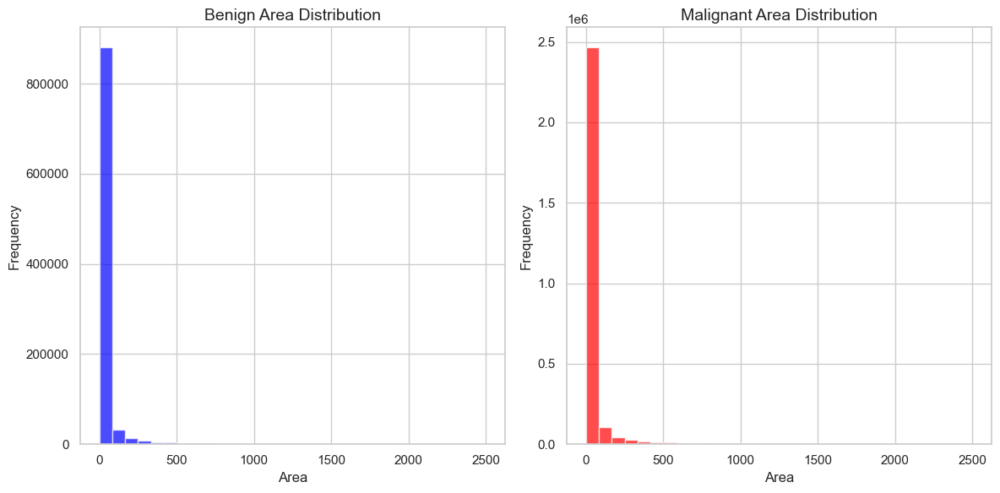

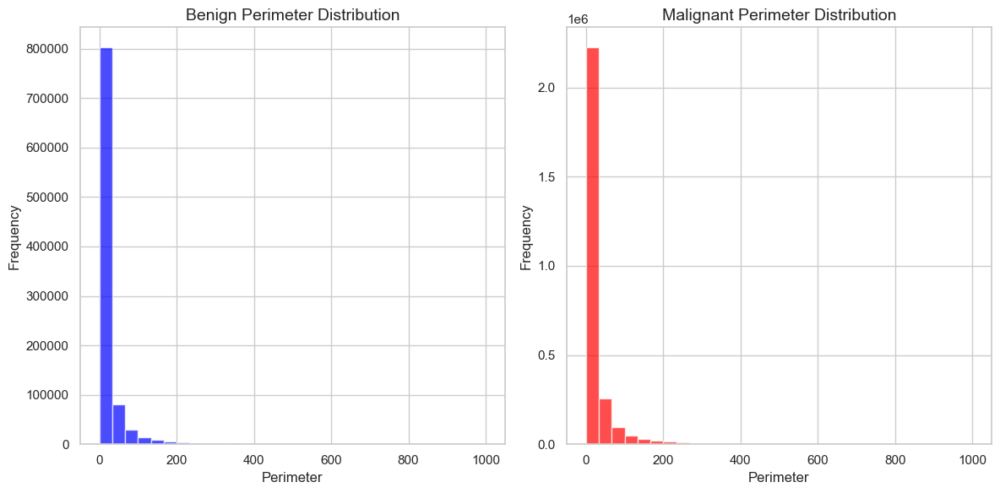

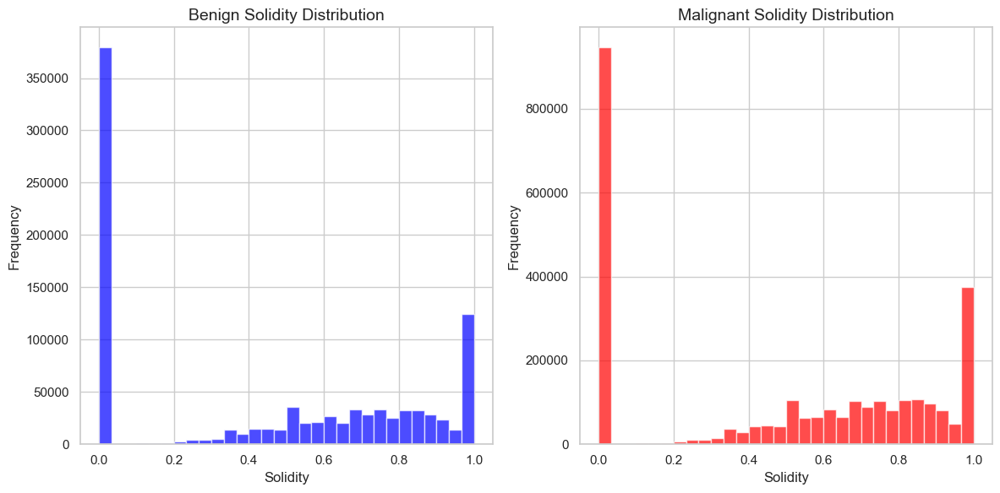

In [55]:
# Directory paths
benign_dir = os.path.join(current_directory, 'data/train/benign')
malignant_dir = os.path.join(current_directory, 'data/train/malignant')

# Initialize lists to hold features
benign_features = []
malignant_features = []

# Function to process images in a directory
def process_images_in_directory(directory, features_list):
    for filename in os.listdir(directory):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp')):
            # Load the image
            image = cv2.imread(os.path.join(directory, filename))
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            
            # Segment the image
            binary_image = segment_image(gray_image)
            
            # Extract morphological features
            features = extract_morphological_features(binary_image)
            
            # Store the features
            for feature in features:
                features_list.append(feature)

# Process images in both directories
process_images_in_directory(benign_dir, benign_features)
process_images_in_directory(malignant_dir, malignant_features)

# Convert lists to numpy arrays
benign_areas = [feature['area'] for feature in benign_features]
benign_perimeters = [feature['perimeter'] for feature in benign_features]
benign_solidities = [feature['solidity'] for feature in benign_features]

malignant_areas = [feature['area'] for feature in malignant_features]
malignant_perimeters = [feature['perimeter'] for feature in malignant_features]
malignant_solidities = [feature['solidity'] for feature in malignant_features]

# Summary for benign and malignant images
benign_area_summary = summarize_features(benign_areas)
benign_perimeter_summary = summarize_features(benign_perimeters)
benign_solidity_summary = summarize_features(benign_solidities)

malignant_area_summary = summarize_features(malignant_areas)
malignant_perimeter_summary = summarize_features(malignant_perimeters)
malignant_solidity_summary = summarize_features(malignant_solidities)

# Print summaries
print("Benign Area Summary:", benign_area_summary)
print("Benign Perimeter Summary:", benign_perimeter_summary)
print("Benign Solidity Summary:", benign_solidity_summary)
print("\nMalignant Area Summary:", malignant_area_summary)
print("Malignant Perimeter Summary:", malignant_perimeter_summary)
print("Malignant Solidity Summary:", malignant_solidity_summary)



# Function to plot side-by-side distributions for benign and malignant features
def plot_feature_distribution_side_by_side(benign_features, malignant_features, feature_name, x_range=None):
    """
    Plot side-by-side distributions of a feature (area, perimeter, solidity) for benign and malignant categories,
    without sharing the y-axis.
    :param benign_features: List of feature values for benign category.
    :param malignant_features: List of feature values for malignant category.
    :param feature_name: Name of the feature (for title).
    :param x_range: Tuple for x-axis range (min, max).
    """
    fig, axs = plt.subplots(1, 2, figsize=(12, 6))  # Two subplots side by side
    
    # Benign distribution
    axs[0].hist(benign_features, bins=30, range=x_range, color='blue', alpha=0.7)
    axs[0].set_title(f'Benign {feature_name} Distribution', fontsize=14)
    axs[0].set_xlabel(feature_name, fontsize=12)
    axs[0].set_ylabel('Frequency', fontsize=12)
    axs[0].grid(True)
    
    # Malignant distribution
    axs[1].hist(malignant_features, bins=30, range=x_range, color='red', alpha=0.7)
    axs[1].set_title(f'Malignant {feature_name} Distribution', fontsize=14)
    axs[1].set_xlabel(feature_name, fontsize=12)
    axs[1].set_ylabel('Frequency', fontsize=12)
    axs[1].grid(True)
    
    # Adjust layout
    plt.tight_layout()
    plt.show()


x_range_area = (0, 2500)
x_range_perimeter = (0, 1000)

# Plot distributions for area, perimeter, and solidity (side by side)
plot_feature_distribution_side_by_side(benign_areas, malignant_areas, 'Area', x_range_area)
plot_feature_distribution_side_by_side(benign_perimeters, malignant_perimeters, 'Perimeter', x_range_perimeter)
plot_feature_distribution_side_by_side(benign_solidities, malignant_solidities, 'Solidity')

    


In [56]:
# Function to loop through images in a directory and calculate color metrics
def calculate_average_color_for_directory(directory):
    color_metrics_list = []
    
    # Loop through images in the directory
    for filename in os.listdir(directory):
        file_path = os.path.join(directory, filename)
        
        # Only process image files
        if file_path.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp')):
            image = cv2.imread(file_path)
            color_metrics = extract_color_metrics(image)
            color_metrics_list.append(color_metrics)
    
    # Calculate the average color for all images in the directory
    avg_red = np.mean([metrics['mean_red'] for metrics in color_metrics_list])
    avg_green = np.mean([metrics['mean_green'] for metrics in color_metrics_list])
    avg_blue = np.mean([metrics['mean_blue'] for metrics in color_metrics_list])
    
    return avg_red, avg_green, avg_blue

# Directories for benign and malignant images
benign_dir = os.path.join(current_directory, 'data/train/benign')
malignant_dir = os.path.join(current_directory, 'data/train/malignant')

# Calculate the average color for benign and malignant images
benign_avg_red, benign_avg_green, benign_avg_blue = calculate_average_color_for_directory(benign_dir)
malignant_avg_red, malignant_avg_green, malignant_avg_blue = calculate_average_color_for_directory(malignant_dir)

# Print the average color metrics
print(f"Benign - Average Red: {benign_avg_red:.2f}, Average Green: {benign_avg_green:.2f}, Average Blue: {benign_avg_blue:.2f}")
print(f"Malignant - Average Red: {malignant_avg_red:.2f}, Average Green: {malignant_avg_green:.2f}, Average Blue: {malignant_avg_blue:.2f}")


Benign - Average Red: 193.26, Average Green: 172.90, Average Blue: 190.98
Malignant - Average Red: 204.10, Average Green: 153.26, Average Blue: 196.60


### Seeing the number of images in each class

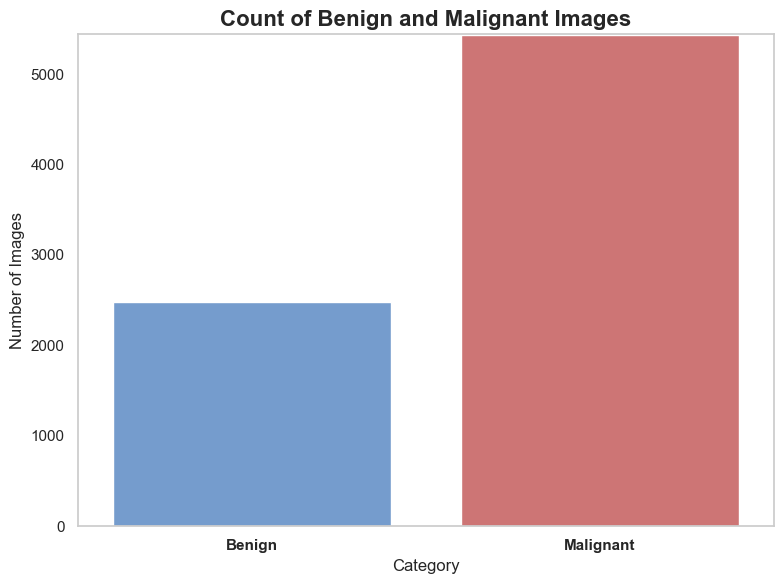

In [57]:
# Path to the data folder
data_folder = current_directory + '/data/'

# Subfolder names
benign_folder = os.path.join(data_folder, "benign")
malignant_folder = os.path.join(data_folder, "malignant")

# Count the number of images in each folder
benign_count = len([file for file in os.listdir(benign_folder) if file.endswith(('.png', '.jpg', '.jpeg'))])
malignant_count = len([file for file in os.listdir(malignant_folder) if file.endswith(('.png', '.jpg', '.jpeg'))])

# Create a dataframe for visualization
data = pd.DataFrame({
    "Category": ["Benign", "Malignant"],
    "Count": [benign_count, malignant_count]
})


sns.set_theme(style="whitegrid", palette="coolwarm")

# Create the plot
plt.figure(figsize=(8, 6))
sns.barplot(data=data, x="Category", y="Count", palette=["#6a9bd8", "#d86a6a"], saturation=0.8)


plt.title("Count of Benign and Malignant Images", fontsize=16, weight='bold')
plt.ylabel("Number of Images", fontsize=12)
plt.xlabel("Category", fontsize=12)
plt.ylim(0, max(data["Count"]) + 10)
plt.xticks(fontsize=11, weight="bold")
plt.yticks(fontsize=11)


plt.grid(False)

# Show the plot
plt.tight_layout()
plt.show()


Ensuring we have the same proportions on training and validation

In [58]:
# Define the paths to train and test directories
train_directory = current_directory + '/data/train'
test_directory = current_directory + '/data/test'
# Function to count the number of images in a directory
def count_images(directory):
    class_counts = {}
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            class_counts[folder] = len(os.listdir(folder_path))
    return class_counts

# Count images in train and test directories for each class
train_class_counts = count_images(train_directory)
test_class_counts = count_images(test_directory)

print("Number of images in each class in the train directory:")
print(train_class_counts)

print("\nNumber of images in each class in the test directory:")
print(test_class_counts)

Number of images in each class in the train directory:
{'benign': 1984, 'malignant': 4343}

Number of images in each class in the test directory:
{'benign': 496, 'malignant': 1086}


#### Identifying the sizes of the images

In [59]:
# Define the paths to train and test directories
train_directory = current_directory + '/data/train'
test_directory = current_directory + '/data/test'

# Function to find the largest and smallest images in a directory
def find_extreme_images(directory):
    # Define the variables for the smallest and biggest images
    largest_image = None
    smallest_image = None
    largest_size = 0
    smallest_size = float('inf')  # Infinite number to initialize

    # Only loop through the 'benign' and 'malignant' subfolders
    for folder in ['benign', 'malignant']:
        folder_path = os.path.join(directory, folder)
        for file in os.listdir(folder_path):
            file_path = os.path.join(folder_path, file)
            # Open the image
            with Image.open(file_path) as img:
                img_size = img.size[0] * img.size[1]  # Width * Height to get the size
                # Update the largest and smallest image if necessary
                if img_size > largest_size:
                    largest_size = img_size
                    largest_image = file_path, img.size
                if img_size < smallest_size:
                    smallest_size = img_size
                    smallest_image = file_path, img.size

    return largest_image, smallest_image

# Find the largest and smallest images in the train and test directories
largest_train_image, smallest_train_image = find_extreme_images(train_directory)
largest_test_image, smallest_test_image = find_extreme_images(test_directory)

# Print results
print("Largest image in the train directory:")
print("File Path:", largest_train_image[0])
print("Size (Width x Height):", largest_train_image[1])
print("\nSmallest image in the train directory:")
print("File Path:", smallest_train_image[0])
print("Size (Width x Height):", smallest_train_image[1])
print("\nLargest image in the test directory:")
print("File Path:", largest_test_image[0])
print("Size (Width x Height):", largest_test_image[1])
print("\nSmallest image in the test directory:")
print("File Path:", smallest_test_image[0])
print("Size (Width x Height):", smallest_test_image[1])

Largest image in the train directory:
File Path: c:\Users\X571\Downloads\DeepLearning24_25/data/train\benign\SOB_B_A-14-22549AB-100-001.png
Size (Width x Height): (700, 460)

Smallest image in the train directory:
File Path: c:\Users\X571\Downloads\DeepLearning24_25/data/train\malignant\SOB_M_PC-14-12465-100-002.png
Size (Width x Height): (700, 456)

Largest image in the test directory:
File Path: c:\Users\X571\Downloads\DeepLearning24_25/data/test\benign\SOB_B_A-14-22549AB-100-002.png
Size (Width x Height): (700, 460)

Smallest image in the test directory:
File Path: c:\Users\X571\Downloads\DeepLearning24_25/data/test\malignant\SOB_M_PC-14-12465-100-001.png
Size (Width x Height): (700, 456)


#### Resizing the images to a common and workable size and Splitting the data into Train and Validation

In [60]:
source_folders = ['benign', 'malignant']

# Initialize empty lists for train and test data
X_train = []
y_train = []
X_test = []
y_test = []

# Function to resize images and create numpy arrays
def resize_and_create_arrays(directory, X, y, target_size=(128, 128)):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path) and folder in source_folders:
            label = source_folders.index(folder)  # 0 for benign, 1 for malignant
            for file in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file)
                try:
                    with Image.open(file_path) as img:
                        # Resize image to target size
                        img_resized = img.resize(target_size)
                        # Convert image to numpy array
                        img_array = np.array(img_resized)
                        # Append image array to X and label to y
                        X.append(img_array)
                        y.append(label)
                except Exception as e:
                    print(f"Error processing {file_path}: {e}")

# Resize images and create arrays for the train directory
resize_and_create_arrays(train_directory, X_train, y_train)

# Resize images andcreate arrays for the test directory
resize_and_create_arrays(test_directory, X_test, y_test)

# Convert lists to numpy arrays
X_train = np.array(X_train)
y_train = np.array(y_train)
X_test = np.array(X_test)
y_test = np.array(y_test)

# Print dataset information
print("Resized images and created X and y arrays.")
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

Resized images and created X and y arrays.
X_train shape: (6327, 128, 128, 3)
y_train shape: (6327,)
X_test shape: (1582, 128, 128, 3)
y_test shape: (1582,)


## Seeing the color Distribution of Beningn and Maligant Images

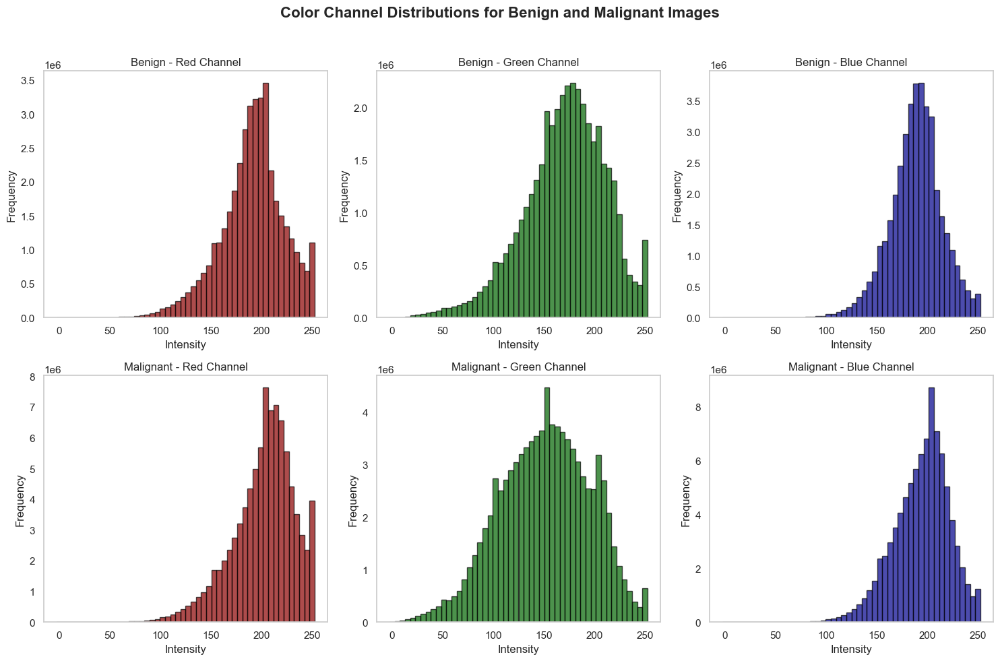

In [61]:
# Concatenate training and testing datasets
X_all = np.concatenate([X_train, X_test], axis=0)
y_all = np.concatenate([y_train, y_test], axis=0)

# Define the number of bins for histograms
num_bins = 50

# Function to compute histograms incrementally
def compute_histograms(X, y, label, num_bins=50):
    red_hist = np.zeros(num_bins)
    green_hist = np.zeros(num_bins)
    blue_hist = np.zeros(num_bins)
    bin_edges = None
    
    for img, lbl in zip(X, y):
        if lbl == label:
            # Compute histograms for each channel
            r_hist, bin_edges = np.histogram(img[:, :, 0].ravel(), bins=num_bins, range=(0, 255))
            g_hist, _ = np.histogram(img[:, :, 1].ravel(), bins=num_bins, range=(0, 255))
            b_hist, _ = np.histogram(img[:, :, 2].ravel(), bins=num_bins, range=(0, 255))
            
            # Accumulate the histograms
            red_hist += r_hist
            green_hist += g_hist
            blue_hist += b_hist
    
    return red_hist, green_hist, blue_hist, bin_edges

# Compute histograms for benign (label=0) and malignant (label=1)
benign_red_hist, benign_green_hist, benign_blue_hist, bin_edges = compute_histograms(X_all, y_all, label=0, num_bins=num_bins)
malignant_red_hist, malignant_green_hist, malignant_blue_hist, _ = compute_histograms(X_all, y_all, label=1, num_bins=num_bins)

# Plot histograms for benign and malignant distributions
fig, axes = plt.subplots(2, 3, figsize=(15, 10))

# Benign histograms
axes[0, 0].bar(bin_edges[:-1], benign_red_hist, width=np.diff(bin_edges), color='darkred', alpha=0.7, edgecolor='black')
axes[0, 0].set_title("Benign - Red Channel")
axes[0, 1].bar(bin_edges[:-1], benign_green_hist, width=np.diff(bin_edges), color='darkgreen', alpha=0.7, edgecolor='black')
axes[0, 1].set_title("Benign - Green Channel")
axes[0, 2].bar(bin_edges[:-1], benign_blue_hist, width=np.diff(bin_edges), color='darkblue', alpha=0.7, edgecolor='black')
axes[0, 2].set_title("Benign - Blue Channel")

# Malignant histograms
axes[1, 0].bar(bin_edges[:-1], malignant_red_hist, width=np.diff(bin_edges), color='darkred', alpha=0.7, edgecolor='black')
axes[1, 0].set_title("Malignant - Red Channel")
axes[1, 1].bar(bin_edges[:-1], malignant_green_hist, width=np.diff(bin_edges), color='darkgreen', alpha=0.7, edgecolor='black')
axes[1, 1].set_title("Malignant - Green Channel")
axes[1, 2].bar(bin_edges[:-1], malignant_blue_hist, width=np.diff(bin_edges), color='darkblue', alpha=0.7, edgecolor='black')
axes[1, 2].set_title("Malignant - Blue Channel")

# Adjust layout and labels
for ax in axes.flatten():
    ax.set_xlabel("Intensity")
    ax.set_ylabel("Frequency")
    ax.grid(False)

fig.suptitle("Color Channel Distributions for Benign and Malignant Images", fontsize=16, weight='bold')
plt.tight_layout(rect=[0, 0, 1, 0.96])
plt.show()


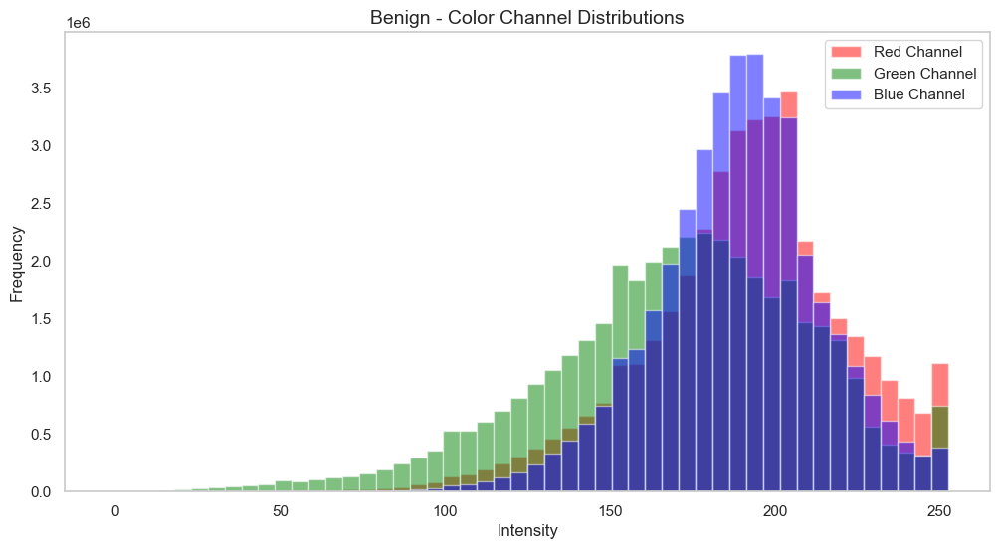

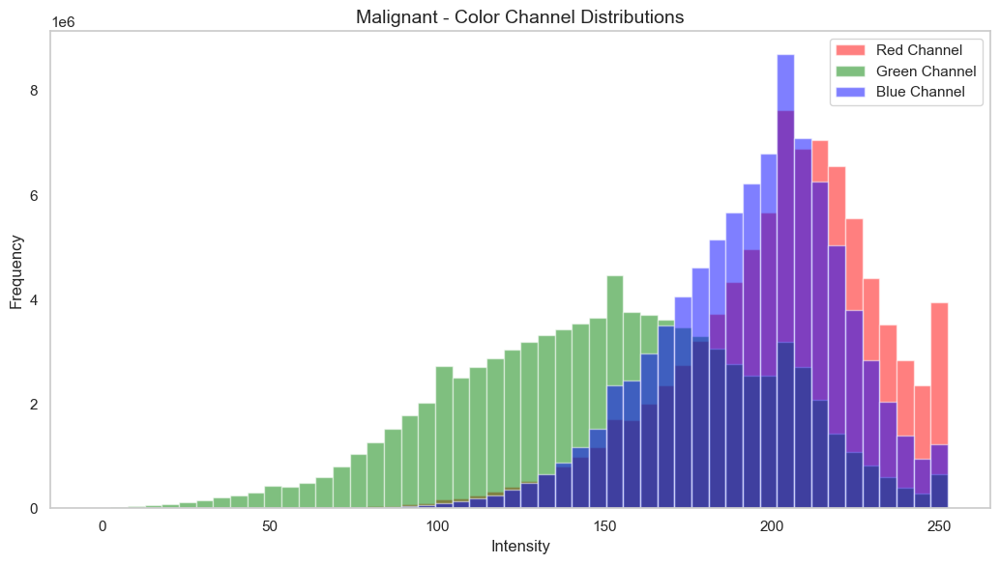

In [62]:
# Concatenate training and testing datasets
X_all = np.concatenate([X_train, X_test], axis=0)
y_all = np.concatenate([y_train, y_test], axis=0)

# Function to compute histograms incrementally
def compute_histograms(X, y, label, num_bins=50):
    red_hist = np.zeros(num_bins)
    green_hist = np.zeros(num_bins)
    blue_hist = np.zeros(num_bins)
    bin_edges = None
    
    for img, lbl in zip(X, y):
        if lbl == label:
            # Compute histograms for each channel
            r_hist, bin_edges = np.histogram(img[:, :, 0].ravel(), bins=num_bins, range=(0, 255))
            g_hist, _ = np.histogram(img[:, :, 1].ravel(), bins=num_bins, range=(0, 255))
            b_hist, _ = np.histogram(img[:, :, 2].ravel(), bins=num_bins, range=(0, 255))
            
            # Accumulate the histograms
            red_hist += r_hist
            green_hist += g_hist
            blue_hist += b_hist
    
    return red_hist, green_hist, blue_hist, bin_edges

# Compute histograms for benign (label=0) and malignant (label=1)
benign_red_hist, benign_green_hist, benign_blue_hist, bin_edges = compute_histograms(X_all, y_all, label=0)
malignant_red_hist, malignant_green_hist, malignant_blue_hist, _ = compute_histograms(X_all, y_all, label=1)

# Plot histogram distributions for benign
fig, ax = plt.subplots(1, 1, figsize=(12, 6))
ax.bar(bin_edges[:-1], benign_red_hist, width=np.diff(bin_edges), color='red', alpha=0.5, label='Red Channel')
ax.bar(bin_edges[:-1], benign_green_hist, width=np.diff(bin_edges), color='green', alpha=0.5, label='Green Channel')
ax.bar(bin_edges[:-1], benign_blue_hist, width=np.diff(bin_edges), color='blue', alpha=0.5, label='Blue Channel')
ax.set_title('Benign - Color Channel Distributions', fontsize=14)
ax.set_xlabel('Intensity', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.legend()
ax.grid(False)

# Plot histogram distributions for malignant
fig, ax = plt.subplots(1, 1, figsize=(10.5, 6))
ax.bar(bin_edges[:-1], malignant_red_hist, width=np.diff(bin_edges), color='red', alpha=0.5, label='Red Channel')
ax.bar(bin_edges[:-1], malignant_green_hist, width=np.diff(bin_edges), color='green', alpha=0.5, label='Green Channel')
ax.bar(bin_edges[:-1], malignant_blue_hist, width=np.diff(bin_edges), color='blue', alpha=0.5, label='Blue Channel')
ax.set_title('Malignant - Color Channel Distributions', fontsize=14)
ax.set_xlabel('Intensity', fontsize=12)
ax.set_ylabel('Frequency', fontsize=12)
ax.legend()
ax.grid(False)

plt.tight_layout()
plt.show()


## Experimenting with Different Image Transformations

ImageDataGenerator

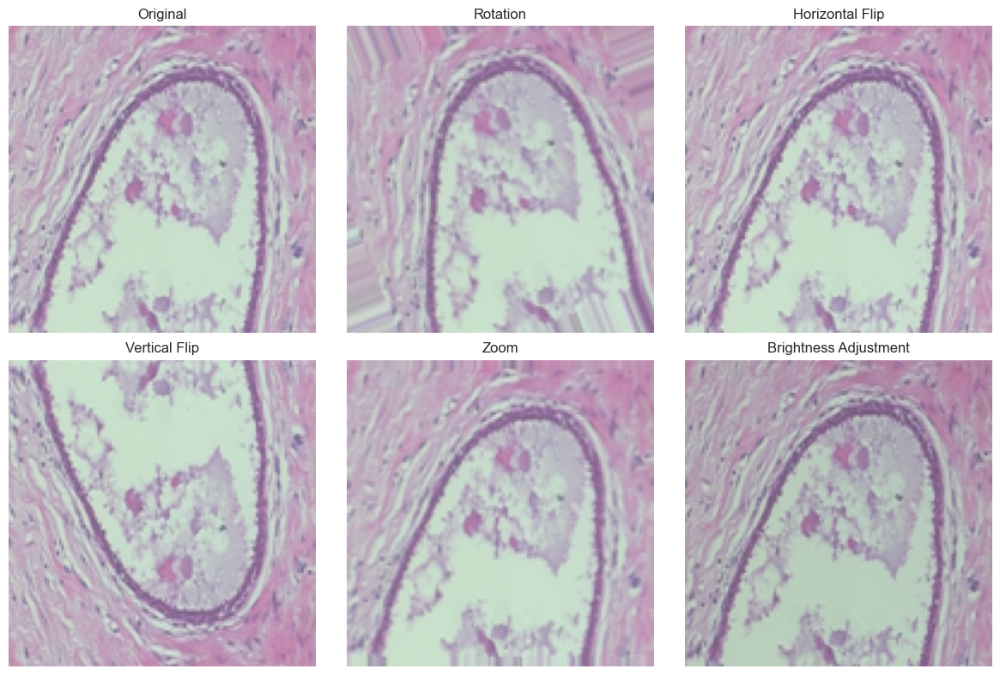

In [63]:
# Define the image transformations using ImageDataGenerator
augmentations = {
    "Rotation": ImageDataGenerator(rotation_range=30),
    "Horizontal Flip": ImageDataGenerator(horizontal_flip=True),
    "Vertical Flip": ImageDataGenerator(vertical_flip=True),
    "Zoom": ImageDataGenerator(zoom_range=0.2),
    "Brightness Adjustment": ImageDataGenerator(brightness_range=[0.8, 1.2]),
}

# Choose a sample image from X_train
sample_image = X_train[0]  # Pick the first image
sample_image = sample_image.reshape((1,) + sample_image.shape)  # Reshape for augmentation

# Plot 
plt.figure(figsize=(12, 8))

plt.subplot(2, 3, 1)
plt.imshow(sample_image[0].astype('uint8'))
plt.title("Original")
plt.axis('off')


for i, (name, generator) in enumerate(augmentations.items(), start=2):
    # Generate a transformed image
    transformed_image = next(generator.flow(sample_image, batch_size=1))[0]

    # Plot the augmented image
    plt.subplot(2, 3, i)
    plt.imshow(transformed_image.astype('uint8'))
    plt.title(name)
    plt.axis('off')

plt.tight_layout()
plt.savefig("image_augmentation_plot.png", dpi=300)
plt.show()


Other Image Transformations

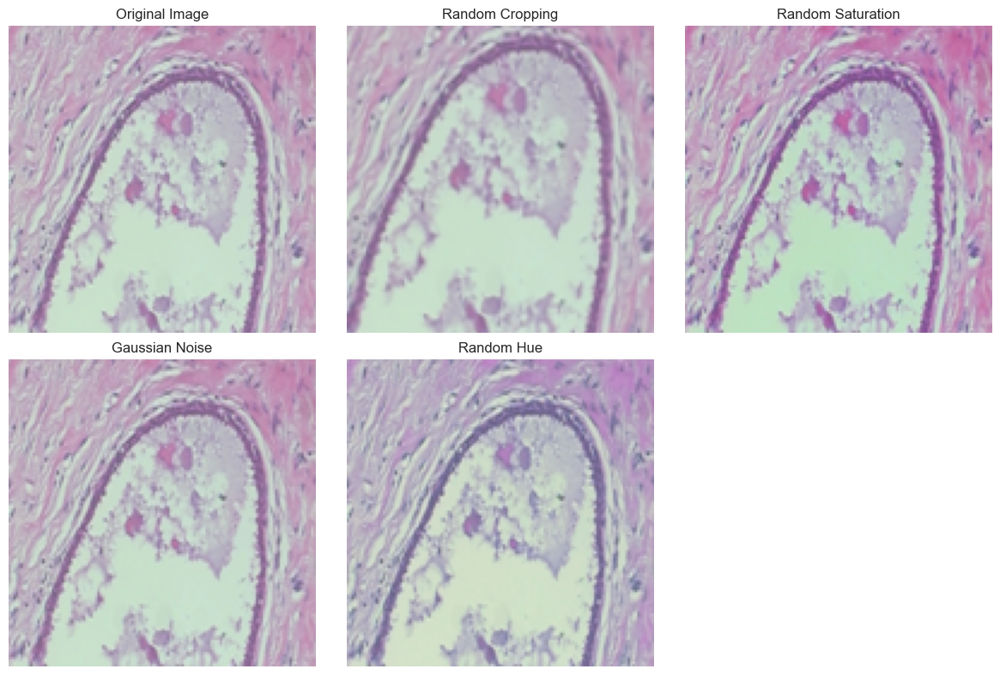

In [64]:
# Define a sample image from X_train
sample_image = X_train[0]  # Choose the first image as an example

# Define custom augmentations
def advanced_augmentations(image):
    # Random Cropping
    cropped_image = tf.image.random_crop(image, size=[112, 112, 3])  # Crop to 112x112
    cropped_image = tf.image.resize(cropped_image, [128, 128])  # Resize back to 128x128
    
    # Random Saturation
    saturated_image = tf.image.random_saturation(image, lower=0.5, upper=2.0)
    
    # Add Gaussian Noise
    noise = tf.random.normal(shape=tf.shape(image), mean=0.0, stddev=0.05, dtype=tf.float32)
    noisy_image = tf.clip_by_value(image + noise, 0.0, 255.0)  # Ensure pixel values remain in valid range
    
    # Random Hue Change
    hue_image = tf.image.random_hue(image, max_delta=0.1)  # Simulating grayscale conversion with hue changes
    
    return cropped_image, saturated_image, noisy_image, hue_image

# Get augmented images
cropped_image, saturated_image, noisy_image, hue_image = advanced_augmentations(sample_image)

augmentation_names = [
    "Random Cropping",
    "Random Saturation",
    "Gaussian Noise",
    "Random Hue"
]

# Total images: original + augmented
total_images = 1 + 4

# Determine grid size
cols = 3
rows = math.ceil(total_images / cols)

# Plot
plt.figure(figsize=(12, rows * 4))

# Plot the original image
plt.subplot(rows, cols, 1)
plt.imshow(sample_image.astype('uint8'))
plt.axis('off')
plt.title('Original Image')

# Plot augmented images
augmented_images = [cropped_image, saturated_image, noisy_image, hue_image]
for i, (aug_img, name) in enumerate(zip(augmented_images, augmentation_names)):
    plt.subplot(rows, cols, i + 2)
    plt.imshow(aug_img.numpy().astype('uint8'))
    plt.axis('off')
    plt.title(name)

plt.tight_layout()
plt.savefig("image_augmentation_plot2.png", dpi=300)
plt.show()


#### Rescalling

In [41]:
X_train = X_train.astype('float32') / 255
X_test = X_test.astype('float32') / 255

#### Shuffling the data

In [42]:
X_train, y_train = shuffle(X_train, y_train, random_state=42)

#### Converting the data into tensors

In [43]:
X_train= tf.constant(X_train, dtype='float32')
X_test= tf.constant(X_test, dtype='float32')
y_train= tf.constant(y_train, dtype='float32')
y_test= tf.constant(y_test, dtype='float32')

# Building the model

#### Without ImageDataGenerator

In [44]:
model = Sequential()

# Convolutional Layers
model.add(Conv2D(filters=16, kernel_size=3, activation='relu', padding='same', input_shape=(X_train.shape[1:])))
model.add(MaxPooling2D(pool_size=(2, 2)))
model.add(Conv2D(filters=32, kernel_size=3, activation='relu', padding='same'))
model.add(MaxPooling2D(pool_size=(2, 2)))

# GlobalAveragePooling instead of Flatten
model.add(GlobalAveragePooling2D())

# Dense Layers
model.add(Dense(64, activation='relu'))
model.add(Dropout(0.3))
model.add(Dense(1, activation='sigmoid'))

# Compile Model
model.compile(optimizer=AdamW(learning_rate=0.0001), loss='binary_crossentropy', metrics=['accuracy'])

# Callbacks
early_stopping = EarlyStopping(monitor='val_loss', patience=5, restore_best_weights=True)
reduce_lr = ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=3, min_lr=1e-6)


In [45]:
# Train the model
history = model.fit(
    X_train, y_train, 
    batch_size=150, 
    epochs=100, 
    validation_split=0.25, 
    verbose=1, 
    callbacks=[early_stopping, reduce_lr])

Epoch 1/100
32/32 [==============================] - 47s 1s/step - loss: 0.6728 - accuracy: 0.6259 - val_loss: 0.6502 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 2/100
32/32 [==============================] - 36s 1s/step - loss: 0.6452 - accuracy: 0.6754 - val_loss: 0.6183 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 3/100
32/32 [==============================] - 29s 882ms/step - loss: 0.6258 - accuracy: 0.6790 - val_loss: 0.6009 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 4/100
32/32 [==============================] - 25s 782ms/step - loss: 0.6150 - accuracy: 0.6795 - val_loss: 0.5896 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 5/100
32/32 [==============================] - 35s 1s/step - loss: 0.6034 - accuracy: 0.6792 - val_loss: 0.5807 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 6/100
32/32 [==============================] - 33s 1s/step - loss: 0.5952 - accuracy: 0.6797 - val_loss: 0.5693 - val_accuracy: 0.7080 - lr: 1.0000e-04
Epoch 7/100
32/32 [===========================

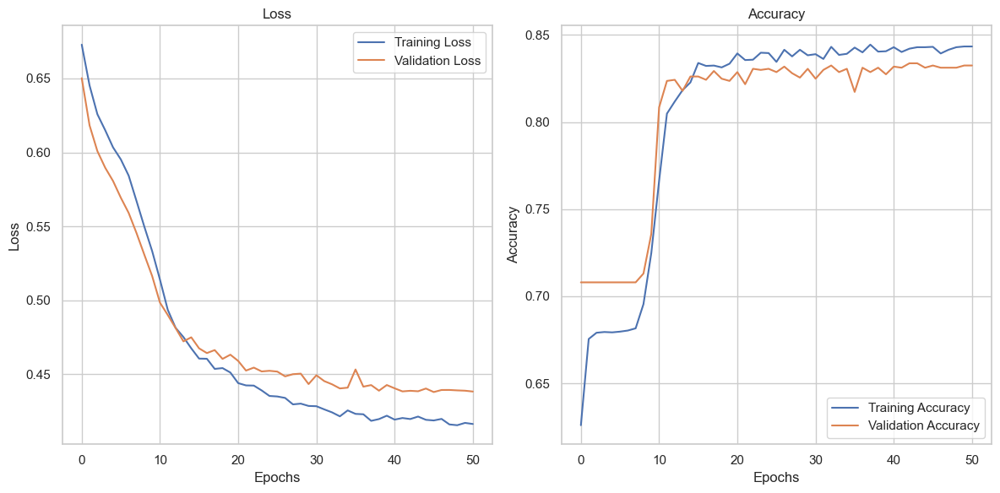

In [46]:
# Plotting training and validation loss and accuracy
plt.figure(figsize=(12, 6))
plt.subplot(1, 2, 1)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.tight_layout()
plt.show()

In [47]:
# Predict on the test set
y_pred = model.predict(X_test)

y_pred_binary = (y_pred > 0.5).astype(int)

test_loss, test_accuracy = model.evaluate(X_test, y_test)

print(f'Test Loss: {test_loss}')
print(f'Test Accuracy: {test_accuracy}')

50/50 [==============================] - 2s 36ms/step - loss: 0.4054 - accuracy: 0.8552
Test Loss: 0.40538114309310913
Test Accuracy: 0.8552465438842773


In [48]:
report = classification_report(y_test, y_pred_binary)
print(report)

              precision    recall  f1-score   support

         0.0       0.82      0.68      0.75       496
         1.0       0.87      0.93      0.90      1086

    accuracy                           0.86      1582
   macro avg       0.85      0.81      0.82      1582
weighted avg       0.85      0.86      0.85      1582



### Checking if the black dots that we noticed with our naked eyes on some malignant images are actually what the Artificial Neural Network's Convolutional Layer looks at

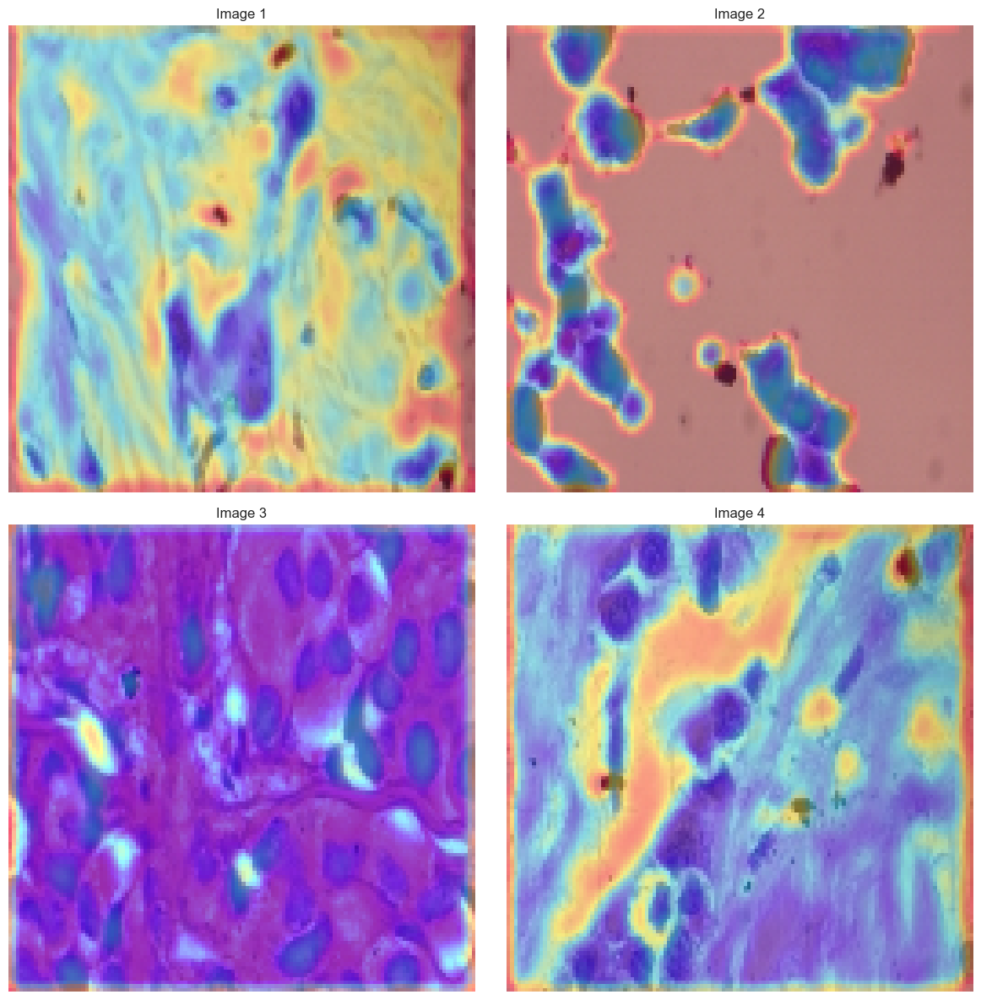

In [ ]:
# Define the specific image paths
image_paths = [
    current_directory+ "/data_p1/malignant/SOB_M_LC-14-13412-400-012.png",
     current_directory+"/data_p1/malignant/SOB_M_DC-14-9461-400-023.png",
     current_directory+"/data_p1/malignant/SOB_M_DC-14-9461-400-028.png",
     current_directory+"/data_p1/malignant/SOB_M_LC-14-13412-400-003.png"
]

# Function to process image and generate Grad-CAM visualization
def generate_grad_cam(model, img_path, conv_layer_name, target_size=(128, 128)):
    img = load_img(img_path, target_size=target_size)
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)  # Add batch dimension
    img_tensor = img_tensor / 255.0  # Normalize

    heatmap_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = heatmap_model(img_tensor)
        loss = predictions[:, np.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = conv_output[0]
    heatmap = tf.reduce_mean(last_conv_layer_output * pooled_grads, axis=-1)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    heatmap = cv2.resize(heatmap, (img.size[0], img.size[1]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    original_img = cv2.resize(original_img, (img.size[0], img.size[1]))
    superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)
    
    return superimposed_img

# Define the model and the convolutional layer to visualize
conv_layer_name = "conv2d_1"

# Create a 2x2 grid to display the images
fig, axes = plt.subplots(2, 2, figsize=(12, 12))

for idx, (ax, img_path) in enumerate(zip(axes.flatten(), image_paths)):
    # Generate Grad-CAM visualization for each image
    grad_cam_img = generate_grad_cam(model, img_path, conv_layer_name)
    
    # Display the superimposed image
    ax.imshow(grad_cam_img)
    ax.axis("off")
    ax.set_title(f"Image {idx + 1}")

plt.tight_layout()
plt.show()


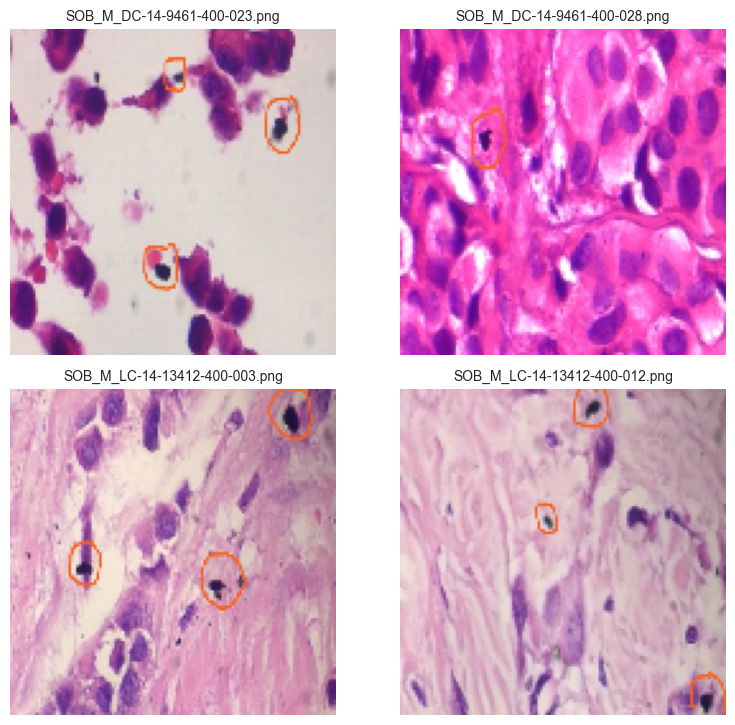

In [ ]:
# Define path to the folder
base_dir = "some_extra_data"

# Get a list of all image files in the folder (limit to 4 for 2x2 layout)
image_files = [
    f for f in os.listdir(base_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))
][:4]  # Take the first 4 images

# Function to preprocess image (resize and normalize)
def preprocess_image(img_path, target_size=(128, 128)):
    img = load_img(img_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  
    img_array = img_array / 255.0  
    return img_array[0]  

# Preprocess images
preprocessed_images = [preprocess_image(os.path.join(base_dir, img)) for img in image_files]

#Plotting
fig, axes = plt.subplots(2, 2, figsize=(8, 8))  

for ax, img, img_name in zip(axes.flatten(), preprocessed_images, image_files):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(img_name, fontsize=10)

for ax in axes.flatten()[len(preprocessed_images):]:
    ax.axis("off")

plt.tight_layout()
plt.subplots_adjust(top=0.88)
plt.show()


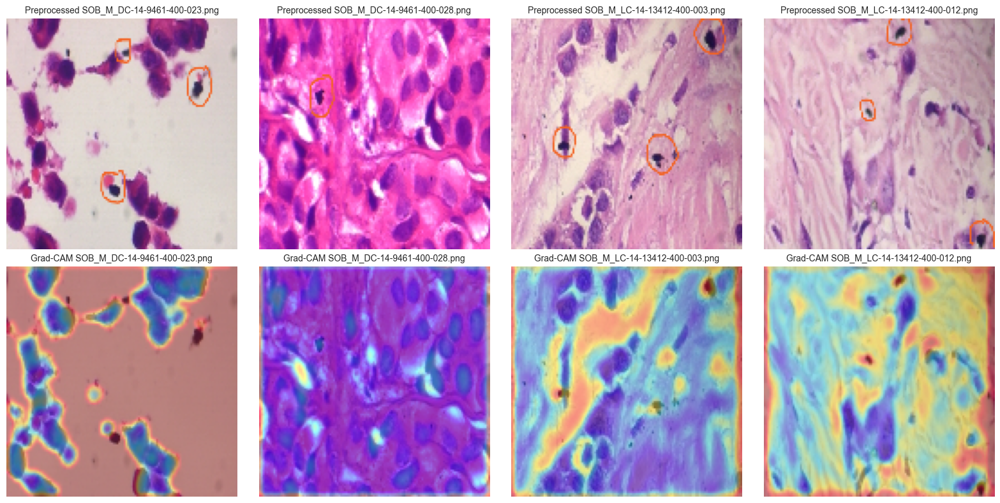

In [ ]:
# Define path to the folder
base_dir = "some_extra_data"

image_files = [
    f for f in os.listdir(base_dir)
    if f.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp'))
][:4]  

# Function to preprocess image (resize and normalize)
def preprocess_image(img_path, target_size=(128, 128)):
    img = load_img(img_path, target_size=target_size)
    img_array = img_to_array(img)
    img_array = np.expand_dims(img_array, axis=0)  # Add batch dimension
    img_array = img_array / 255.0  # Normalize
    return img_array[0]  # Return the image without the batch dimension

# Preprocess images
preprocessed_images = [preprocess_image(os.path.join(base_dir, img)) for img in image_files]



# Define the specific image paths for Grad-CAM
image_paths = [
    current_directory+"/data_p1/malignant/SOB_M_DC-14-9461-400-023.png",
    current_directory+"/data_p1/malignant/SOB_M_DC-14-9461-400-028.png",
    current_directory+"/data_p1/malignant/SOB_M_LC-14-13412-400-003.png",
    current_directory+ "/data_p1/malignant/SOB_M_LC-14-13412-400-012.png"
]

# Function to process image and generate Grad-CAM visualization
def generate_grad_cam(model, img_path, conv_layer_name, target_size=(128, 128)):
    img = load_img(img_path, target_size=target_size)
    img_tensor = img_to_array(img)
    img_tensor = np.expand_dims(img_tensor, axis=0)  
    img_tensor = img_tensor / 255.0  

    heatmap_model = tf.keras.models.Model(
        [model.inputs],
        [model.get_layer(conv_layer_name).output, model.output]
    )

    with tf.GradientTape() as tape:
        conv_output, predictions = heatmap_model(img_tensor)
        loss = predictions[:, np.argmax(predictions[0])]

    grads = tape.gradient(loss, conv_output)
    pooled_grads = tf.reduce_mean(grads, axis=(0, 1, 2))

    last_conv_layer_output = conv_output[0]
    heatmap = tf.reduce_mean(last_conv_layer_output * pooled_grads, axis=-1)

    heatmap = np.maximum(heatmap, 0)
    heatmap /= np.max(heatmap)
    heatmap = cv2.resize(heatmap, (img.size[0], img.size[1]))
    heatmap = np.uint8(255 * heatmap)
    heatmap = cv2.applyColorMap(heatmap, cv2.COLORMAP_JET)

    original_img = cv2.imread(img_path)
    original_img = cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB)
    original_img = cv2.resize(original_img, (img.size[0], img.size[1]))
    superimposed_img = cv2.addWeighted(original_img, 0.6, heatmap, 0.4, 0)
    
    return superimposed_img

# Define the model and the convolutional layer to visualize
conv_layer_name = "conv2d_1"


#Plotting the combined images


fig, axes = plt.subplots(2, 4, figsize=(16, 8)) 


for idx, (ax, img, img_name) in enumerate(zip(axes[0], preprocessed_images, image_files)):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Preprocessed {img_name}", fontsize=10)


for idx, (ax, img_path) in enumerate(zip(axes[1], image_paths)):
    grad_cam_img = generate_grad_cam(model, img_path, conv_layer_name)
    ax.imshow(grad_cam_img)
    ax.axis("off")
    ax.set_title(f"Grad-CAM {os.path.basename(img_path)}", fontsize=10)

plt.tight_layout()
plt.show()


# Stage 2

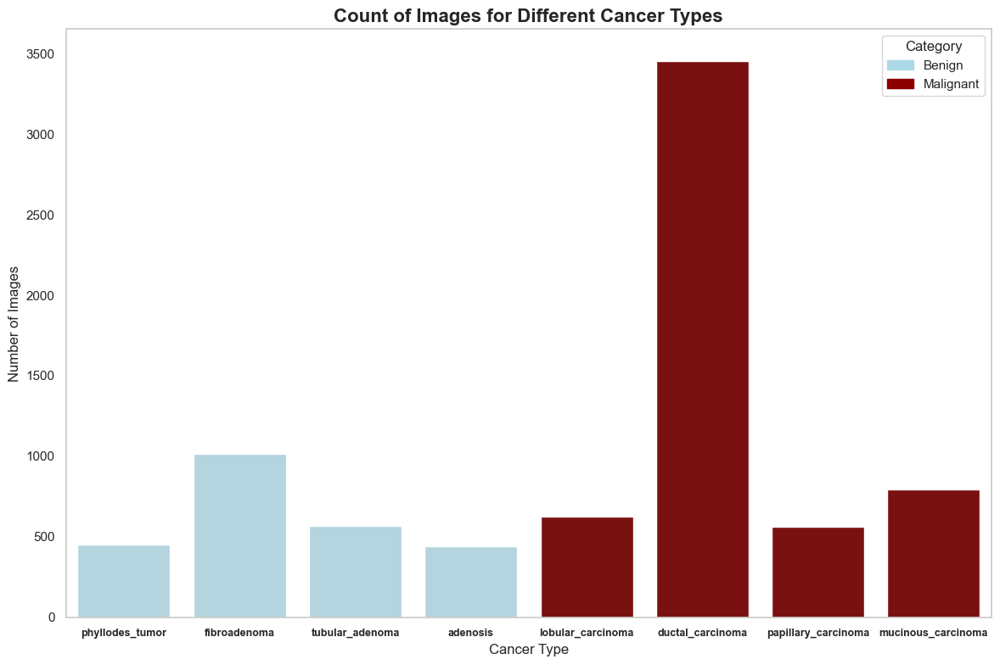

In [ ]:
# Path to the data folder
data_folder = current_directory + '/data_p2/'

# Benign and malignant cancer types
benign_cancer_types = ['phyllodes_tumor', 'fibroadenoma', 'tubular_adenoma', 'adenosis']
malignant_cancer_types = ['lobular_carcinoma', 'ductal_carcinoma', 'papillary_carcinoma', 'mucinous_carcinoma']

# Initialize empty lists to store cancer type names and their image counts
cancer_types = []
image_counts = []
colors = []

# Count images for each cancer type and classify as benign or malignant
for cancer_type in benign_cancer_types + malignant_cancer_types:
    cancer_type_folder = os.path.join(data_folder, cancer_type)
    image_count = len([file for file in os.listdir(cancer_type_folder) if file.endswith(('.png', '.jpg', '.jpeg'))])
    
    cancer_types.append(cancer_type)
    image_counts.append(image_count)
    
    # Assign colors: Light Blue for benign, Deep Red for malignant
    if cancer_type in benign_cancer_types:
        colors.append('lightblue')  # Prettier blue
    else:
        colors.append('darkred')  # Prettier red

# Create a DataFrame for visualization
data = pd.DataFrame({
    "Cancer Type": cancer_types,
    "Image Count": image_counts,
    "Color": colors
})

# Set the plot style
sns.set_theme(style="whitegrid")

# Create the plot
plt.figure(figsize=(12, 8))
sns.barplot(data=data, x="Cancer Type", y="Image Count", hue="Color", dodge=False, palette={'lightblue': 'lightblue', 'darkred': 'darkred'})


plt.title("Count of Images for Different Cancer Types", fontsize=16, weight='bold')
plt.ylabel("Number of Images", fontsize=12)
plt.xlabel("Cancer Type", fontsize=12)
plt.xticks(fontsize=9, weight="bold")
plt.yticks(fontsize=11)
plt.ylim(0, max(data["Image Count"]) + 200)


blue_patch = mpatches.Patch(color='lightblue', label='Benign')
red_patch = mpatches.Patch(color='darkred', label='Malignant')
plt.legend(handles=[blue_patch, red_patch], title="Category", fontsize=11)


plt.grid(False)

plt.tight_layout()
plt.show()


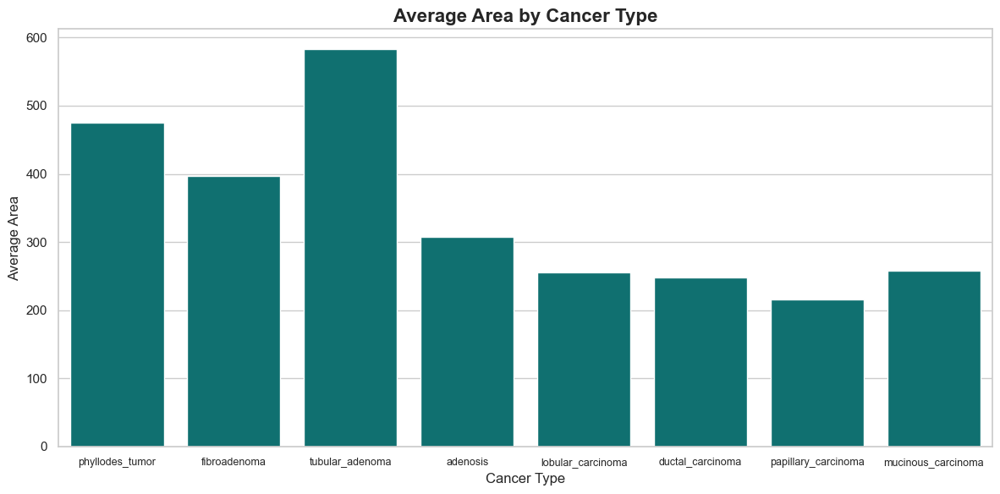

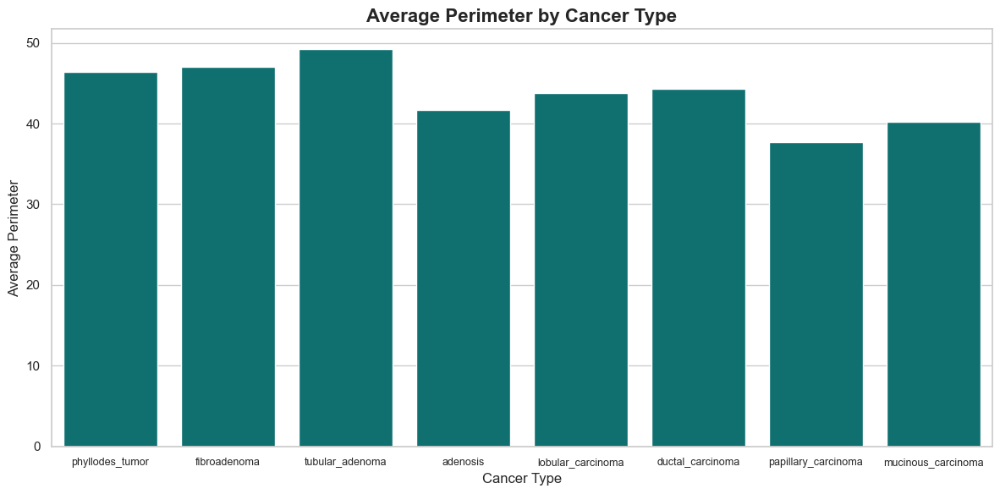

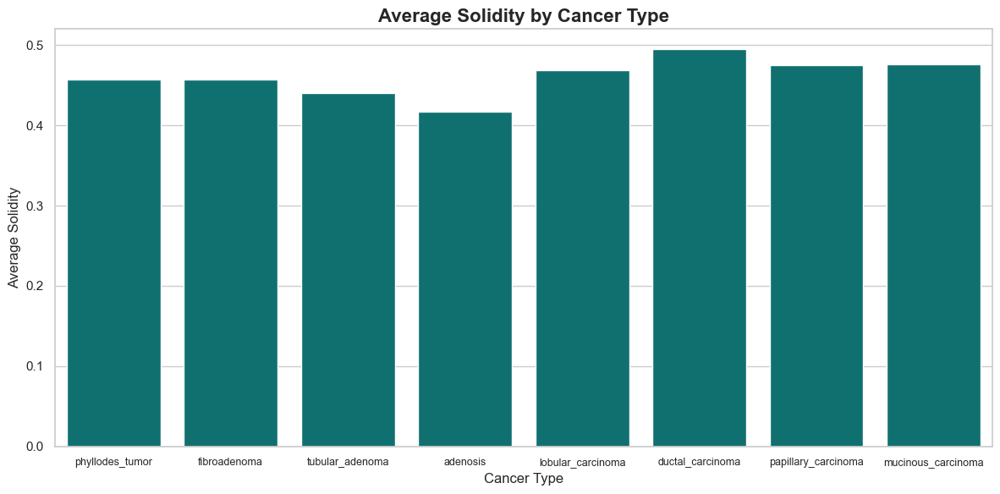

In [ ]:
# Directory path for data
data_folder = os.path.join(current_directory, 'data_p2')

# Define cancer types
cancer_types = [
    'phyllodes_tumor', 'fibroadenoma', 'tubular_adenoma', 'adenosis',
    'lobular_carcinoma', 'ductal_carcinoma', 'papillary_carcinoma', 'mucinous_carcinoma'
]

# Initialize a dictionary to hold features for each cancer type
features_by_cancer_type = {cancer_type: [] for cancer_type in cancer_types}

# Function to process images in a directory
def process_images_in_directory(directory, features_list):
    for filename in os.listdir(directory):
        if filename.lower().endswith(('.png', '.jpg', '.jpeg', '.tif', '.bmp')):
            # Load the image
            image = cv2.imread(os.path.join(directory, filename))
            gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)
            
            # Segment the image
            binary_image = segment_image(gray_image)
            
            # Extract morphological features
            features = extract_morphological_features(binary_image)
            
            # Store the features
            for feature in features:
                features_list.append(feature)

# Process images for each cancer type
for cancer_type in cancer_types:
    directory_path = os.path.join(data_folder, cancer_type)
    process_images_in_directory(directory_path, features_by_cancer_type[cancer_type])

# Calculate average area, perimeter, and solidity for each cancer type
averages = []
for cancer_type in cancer_types:
    areas = [feature['area'] for feature in features_by_cancer_type[cancer_type]]
    perimeters = [feature['perimeter'] for feature in features_by_cancer_type[cancer_type]]
    solidities = [feature['solidity'] for feature in features_by_cancer_type[cancer_type]]
    
    avg_area = np.mean(areas) if areas else 0
    avg_perimeter = np.mean(perimeters) if perimeters else 0
    avg_solidity = np.mean(solidities) if solidities else 0
    
    averages.append({"Cancer_Type": cancer_type, "Avg_Area": avg_area, "Avg_Perimeter": avg_perimeter, "Avg_Solidity": avg_solidity})

# Convert to a pandas DataFrame
df_averages = pd.DataFrame(averages)

#Plotting
sns.set_theme(style="whitegrid")

bar_color = "#008080"

# Plot 1: Average Area
plt.figure(figsize=(12, 6))
sns.barplot(data=df_averages, x="Cancer_Type", y="Avg_Area", color=bar_color)
plt.title("Average Area by Cancer Type", fontsize=16, weight='bold')
plt.xlabel("Cancer Type", fontsize=12)
plt.ylabel("Average Area", fontsize=12)
plt.xticks( fontsize=9)
plt.tight_layout()
plt.show()

# Plot 2: Average Perimeter
plt.figure(figsize=(12, 6))
sns.barplot(data=df_averages, x="Cancer_Type", y="Avg_Perimeter", color=bar_color)
plt.title("Average Perimeter by Cancer Type", fontsize=16, weight='bold')
plt.xlabel("Cancer Type", fontsize=12)
plt.ylabel("Average Perimeter", fontsize=12)
plt.xticks( fontsize=9)
plt.tight_layout()
plt.show()

# Plot 3: Average Solidity
plt.figure(figsize=(12, 6))
sns.barplot(data=df_averages, x="Cancer_Type", y="Avg_Solidity", color=bar_color)
plt.title("Average Solidity by Cancer Type", fontsize=16, weight='bold')
plt.xlabel("Cancer Type", fontsize=12)
plt.ylabel("Average Solidity", fontsize=12)
plt.xticks(fontsize=9)
plt.tight_layout()
plt.show()


Checking the average colours (R,G,B) per cancer type

In [13]:
# Define the paths to train and test directories
train_directory = current_directory + '/data_p2/train'
test_directory = current_directory + '/data_p2/test'
val_directory = current_directory + '/data_p2/val'
# Function to count the number of images in a directory
def count_images(directory):
    class_counts = {}
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path):
            class_counts[folder] = len(os.listdir(folder_path))
    return class_counts

# Count images in train and test directories for each class
train_class_counts = count_images(train_directory)
test_class_counts = count_images(test_directory)
val_class_counts = count_images(val_directory)

print("Number of images in each class in the train directory:")
print(train_class_counts)

print("\nNumber of images in each class in the val directory:")
print(val_class_counts)

print("\nNumber of images in each class in the test directory:")
print(test_class_counts)

Number of images in each class in the train directory:
{'adenosis': 267, 'ductal_carcinoma': 2069, 'fibroadenoma': 607, 'lobular_carcinoma': 377, 'mucinous_carcinoma': 475, 'papillary_carcinoma': 337, 'phyllodes_tumor': 272, 'tubular_adenoma': 341}

Number of images in each class in the val directory:
{'adenosis': 88, 'ductal_carcinoma': 691, 'fibroadenoma': 204, 'lobular_carcinoma': 124, 'mucinous_carcinoma': 159, 'papillary_carcinoma': 111, 'phyllodes_tumor': 91, 'tubular_adenoma': 114}

Number of images in each class in the test directory:
{'adenosis': 89, 'ductal_carcinoma': 691, 'fibroadenoma': 203, 'lobular_carcinoma': 125, 'mucinous_carcinoma': 158, 'papillary_carcinoma': 112, 'phyllodes_tumor': 90, 'tubular_adenoma': 114}


In [14]:
source_folders = ['adenosis', 
                  'fibroadenoma', 
                  'phyllodes_tumor', 
                  'tubular_adenoma',
                  'ductal_carcinoma',
                  'lobular_carcinoma',
                  'mucinous_carcinoma',
                  'papillary_carcinoma']

# Initialize empty lists for train and test data
X_train = []
y_train = []
X_val = []
y_val = []
X_test = []
y_test = []

# Function to resize images and create numpy arrays
def resize_and_create_arrays(directory, X, y, target_size=(128, 128)):
    for folder in os.listdir(directory):
        folder_path = os.path.join(directory, folder)
        if os.path.isdir(folder_path) and folder in source_folders:
            label = source_folders.index(folder)  # 0 for benign, 1 for malignant
            for file in os.listdir(folder_path):
                file_path = os.path.join(folder_path, file)
                try:
                    with Image.open(file_path) as img:
                        # Resize image to target size
                        img_resized = img.resize(target_size)
                        # Convert image to numpy array
                        img_array = np.array(img_resized)
                        # Append image array to X and label to y
                        X.append(img_array)
                        y.append(label)
                except Exception as e:
                    print(f"Error processing {file_path}: {e}")

# Resize images and create arrays for the train directory
resize_and_create_arrays(train_directory, X_train, y_train)

# Resize images andcreate arrays for the val directory
resize_and_create_arrays(val_directory, X_val, y_val)

# Resize images andcreate arrays for the test directory
resize_and_create_arrays(test_directory, X_test, y_test)

# Convert lists to numpy arrays
X_train = np.array(X_train)
y_train = np.array(y_train)
X_val = np.array(X_val)
y_val = np.array(y_val)
X_test = np.array(X_test)
y_test = np.array(y_test)

# Print dataset information
print("Resized images and created X and y arrays.")
print("X_train shape:", X_train.shape)
print("y_train shape:", y_train.shape)
print("X_val shape:", X_val.shape)
print("y_val shape:", y_val.shape)
print("X_test shape:", X_test.shape)
print("y_test shape:", y_test.shape)

Resized images and created X and y arrays.
X_train shape: (4745, 128, 128, 3)
y_train shape: (4745,)
X_val shape: (1582, 128, 128, 3)
y_val shape: (1582,)
X_test shape: (1582, 128, 128, 3)
y_test shape: (1582,)


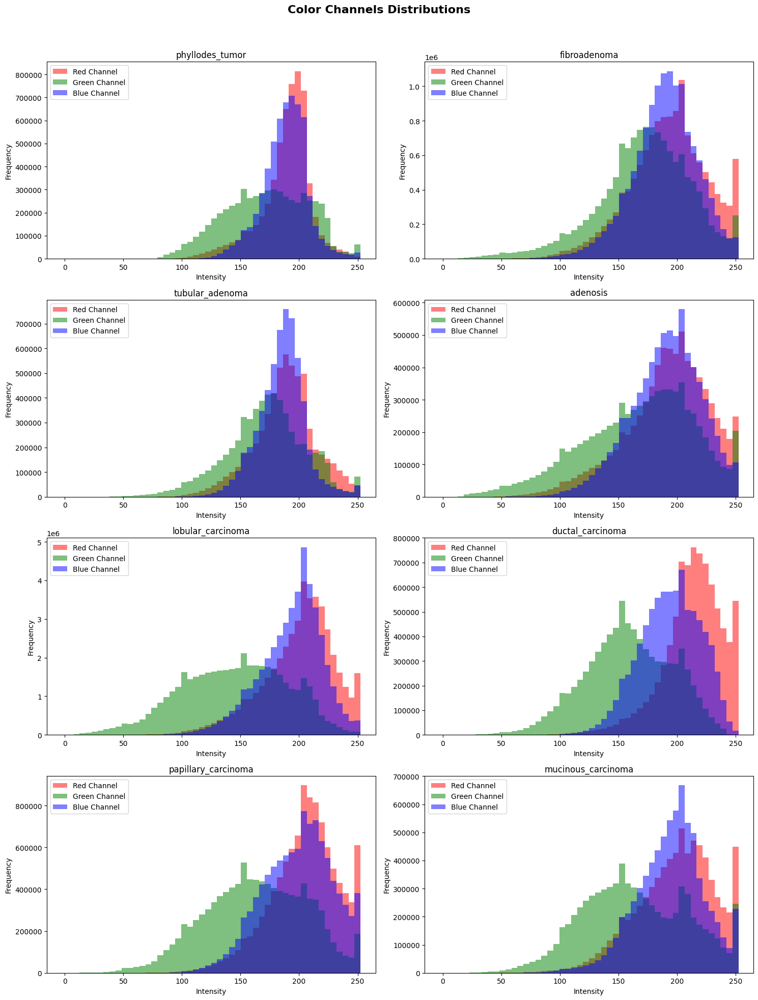

In [17]:
# Concatenate training and testing datasets
X_all = np.concatenate([X_train, X_test], axis=0)
y_all = np.concatenate([y_train, y_test], axis=0)

# Function to compute histograms incrementally
def compute_histograms_for_class(X, y, class_label, num_bins=50):
    red_hist = np.zeros(num_bins)
    green_hist = np.zeros(num_bins)
    blue_hist = np.zeros(num_bins)
    bin_edges = None
    
    for img, lbl in zip(X, y):
        if lbl == class_label:
            # Compute histograms for each channel
            r_hist, bin_edges = np.histogram(img[:, :, 0].ravel(), bins=num_bins, range=(0, 255))
            g_hist, _ = np.histogram(img[:, :, 1].ravel(), bins=num_bins, range=(0, 255))
            b_hist, _ = np.histogram(img[:, :, 2].ravel(), bins=num_bins, range=(0, 255))
            
            # Accumulate the histograms
            red_hist += r_hist
            green_hist += g_hist
            blue_hist += b_hist
    
    return red_hist, green_hist, blue_hist, bin_edges

# Plot histograms for each cancer type
fig, axes = plt.subplots(4, 2, figsize=(15, 20))
axes = axes.flatten()

for idx, cancer_type in enumerate(cancer_types):
    # Compute histograms for the current cancer type
    red_hist, green_hist, blue_hist, bin_edges = compute_histograms_for_class(X_all, y_all, idx)
    
    # Plot histograms in a single subplot
    ax = axes[idx]
    ax.bar(bin_edges[:-1], red_hist, width=np.diff(bin_edges), color='red', alpha=0.5, label='Red Channel')
    ax.bar(bin_edges[:-1], green_hist, width=np.diff(bin_edges), color='green', alpha=0.5, label='Green Channel')
    ax.bar(bin_edges[:-1], blue_hist, width=np.diff(bin_edges), color='blue', alpha=0.5, label='Blue Channel')
    ax.set_title(f'{cancer_type}', fontsize=12)
    ax.set_xlabel('Intensity', fontsize=10)
    ax.set_ylabel('Frequency', fontsize=10)
    ax.legend()
    ax.grid(False)


fig.suptitle('Color Channels Distributions', fontsize=16, fontweight='bold')


plt.tight_layout(rect=[0, 0, 1, 0.96])  
# Save the figure as an image
plt.savefig('color_channel_distributions.png', dpi=300, bbox_inches='tight')

plt.show()